# Visualization LDA

In [1]:
%pwd

'/Users/lichao/DP15_Article/PyCode_v241111'

In [2]:
%cd ..

/Users/lichao/DP15_Article


/Users/lichao/opt/anaconda3/envs/ML/lib/python3.9/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


## Import Package

In [4]:
import geopandas as gpd
import glob
import matplotlib.colors
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from shapely.geometry import Point
from shapely.ops import unary_union

## Load Data and Summerize the Data

In [5]:
count_list = []

### NDVI Coefficient

In [6]:
result_df_ndvi = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_NDVI.xlsx', index_col = 0)

In [7]:
result_df_ndvi.loc[result_df_ndvi['r2'] < 0.5, 'coeff'] = 0

In [8]:
result_df_ndvi['polar'] = result_df_ndvi['coeff'].apply(lambda x: -1 if x < 0 else (1 if x > 0 else 0))

In [9]:
result_df_ndvi['coeff'].mean()

0.00033055320131784405

In [10]:
individual_count = result_df_ndvi['polar'].groupby(result_df_ndvi['polar']).count()

In [11]:
individual_count

polar
-1     94712
 0    117901
 1    170560
Name: polar, dtype: int64

In [12]:
count_list.append(individual_count)

In [13]:
result_df_ndvi_loc = result_df_ndvi.groupby(['lon', 'lat']).mean().reset_index()

In [14]:
result_df_ndvi_loc.shape

(50852, 6)

In [15]:
result_df_ndvi_loc['coeff'].mean()

0.00036437687146643224

In [16]:
result_df_ndvi_loc['polar'] = result_df_ndvi_loc['polar'].apply(lambda x: -1 if x < 0 else (1 if x > 0 else 0))

In [17]:
individual_count = result_df_ndvi_loc['polar'].groupby(result_df_ndvi_loc['polar']).count()

In [18]:
individual_count

polar
-1    12115
 0    14811
 1    23926
Name: polar, dtype: int64

In [19]:
count_list.append(individual_count)

### NTL Coefficient

In [132]:
result_df_ndvi = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_NTL.xlsx', index_col = 0)

In [133]:
result_df_ndvi.loc[result_df_ndvi['r2'] < 0.5, 'coeff'] = 0

In [134]:
result_df_ndvi['polar'] = result_df_ndvi['coeff'].apply(lambda x: -1 if x < 0 else (1 if x > 0 else 0))

In [135]:
result_df_ndvi['coeff'].mean()

-0.0016677021648642443

In [137]:
result_df_ntl = result_df_ndvi.copy()

In [24]:
individual_count = result_df_ndvi['polar'].groupby(result_df_ndvi['polar']).count()

In [25]:
individual_count

polar
-1    317427
 0     50580
 1     15166
Name: polar, dtype: int64

In [26]:
count_list.append(individual_count)

In [27]:
result_df_ndvi_loc = result_df_ndvi.groupby(['lon', 'lat']).mean().reset_index()

In [28]:
result_df_ndvi_loc.shape

(50852, 6)

In [29]:
result_df_ndvi_loc['coeff'].mean()

-0.002036606840185485

In [30]:
result_df_ndvi_loc['polar'] = result_df_ndvi_loc['polar'].apply(lambda x: -1 if x < 0 else (1 if x > 0 else 0))

In [31]:
individual_count = result_df_ndvi_loc['polar'].groupby(result_df_ndvi_loc['polar']).count()

In [32]:
individual_count

polar
-1    35688
 0    10830
 1     4334
Name: polar, dtype: int64

In [33]:
count_list.append(individual_count)

### Income Coefficient

In [34]:
result_df_ndvi = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_income_indiv.xlsx', index_col = 0)

In [35]:
result_df_ndvi.loc[result_df_ndvi['r2'] < 0.5, 'coeff'] = 0

In [36]:
result_df_ndvi['polar'] = result_df_ndvi['coeff'].apply(lambda x: -1 if x < 0 else (1 if x > 0 else 0))

In [37]:
result_df_ndvi['coeff'].mean()

0.01392365545962176

In [38]:
individual_count = result_df_ndvi['polar'].groupby(result_df_ndvi['polar']).count()

In [39]:
individual_count

polar
-1      3023
 0      6028
 1    374122
Name: polar, dtype: int64

In [40]:
count_list.append(individual_count)

In [41]:
result_df_ndvi_loc = result_df_ndvi.groupby(['lon', 'lat']).mean().reset_index()

In [42]:
result_df_ndvi_loc.shape

(50852, 6)

In [43]:
result_df_ndvi_loc['polar'] = result_df_ndvi_loc['polar'].apply(lambda x: -1 if x < 0 else (1 if x > 0 else 0))

In [44]:
individual_count = result_df_ndvi_loc['polar'].groupby(result_df_ndvi_loc['polar']).count()

In [45]:
result_df_ndvi_loc['coeff'].mean()

0.014758455158547111

In [46]:
individual_count

polar
-1     1567
 0     1911
 1    47374
Name: polar, dtype: int64

In [47]:
count_list.append(individual_count)

In [48]:
pd.concat(count_list, axis=1).T.to_excel('03_Results/LocalPDA_Summary.xlsx')

In [49]:
pd.concat(count_list, axis=1).T

polar,-1,0,1
polar,94712,117901,170560
polar,12115,14811,23926
polar,317427,50580,15166
polar,35688,10830,4334
polar,3023,6028,374122
polar,1567,1911,47374


## Visual Map Coefficient

### GDF Coefficient

In [50]:
result_df_ndvi = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_NDVI.xlsx', index_col = 0)

In [51]:
result_df_ndvi.loc[result_df_ndvi['r2'] < 0.5, 'coeff'] = 0

In [52]:
result_df_ndvi_loc = result_df_ndvi.drop_duplicates()

In [53]:
result_df_ndvi_loc = result_df_ndvi_loc[['lat', 'lon', 'coeff']]

In [54]:
result_df_ndvi_loc.columns = ['lat', 'lon', 'coeff_ndvi']

In [138]:
result_df_ntl = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_NTL.xlsx', index_col = 0)

In [139]:
result_df_ntl.loc[result_df_ntl['r2'] < 0.5, 'coeff'] = 0

In [140]:
result_df_ntl_loc = result_df_ntl.drop_duplicates()

In [141]:
result_df_ntl_loc = result_df_ntl_loc[['lat', 'lon', 'coeff']]

In [142]:
result_df_ntl_loc.columns = ['lat', 'lon', 'coeff_ntl']

In [60]:
result_df_income = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_income_indiv.xlsx', index_col = 0)

In [61]:
result_df_income.loc[result_df_income['r2'] < 0.5, 'coeff'] = 0

In [62]:
result_df_income_loc = result_df_income.drop_duplicates()

In [63]:
result_df_income_loc = result_df_income_loc[['lat', 'lon', 'coeff']]

In [64]:
result_df_income_loc.columns = ['lat', 'lon', 'coeff_income']

In [65]:
merged_df = pd.merge(result_df_ndvi_loc, result_df_ntl_loc, on=['lat', 'lon'], how='left')
result_df_loc_merge = pd.merge(merged_df, result_df_income_loc, on=['lat', 'lon'], how='left')

In [66]:
result_df_loc_merge = result_df_loc_merge.groupby(['lat', 'lon']).mean()

In [67]:
result_df_loc_merge = result_df_loc_merge.reset_index()

In [68]:
def create_geometry(row):
    return Point(row['lon'], row['lat'])

In [69]:
result_df_loc_merge['geometry'] = result_df_loc_merge.apply(create_geometry, axis=1)

In [70]:
crs = "EPSG:4326"
result_gdf_loc = gpd.GeoDataFrame(result_df_loc_merge, geometry='geometry', crs=crs)

In [71]:
result_gdf_loc.describe()

,lat,lon,coeff_ndvi,coeff_ntl,coeff_income
count,50852.000000,50852.000000,50852.000000,50852.000000,50852.000000
mean,35.773296,136.851359,0.000364,-0.002037,0.014759
std,2.480900,3.331468,0.002655,0.006116,0.011206
min,24.301767,123.762947,-0.072164,-0.125678,-0.060621
25%,34.667910,135.207962,0.000000,-0.002577,0.008527
50%,35.226959,136.923462,0.000000,-0.001347,0.013553
75%,36.277805,139.635010,0.001134,0.000000,0.018700
max,45.511021,145.742340,0.054274,0.093483,0.162315


### Load Boundary Map

In [312]:
shapefile_path = '01_Data/N03-20_200101.shp'
city_gdf = gpd.read_file(shapefile_path)

In [313]:
city_gdf = city_gdf[['N03_007', 'geometry']]
city_gdf = city_gdf.set_index('N03_007')
city_gdf = city_gdf.groupby(city_gdf.index).geometry.apply(unary_union)

In [314]:
city_gdf = gpd.GeoDataFrame(geometry=city_gdf)
city_gdf = city_gdf.reset_index()
city_gdf.columns = ['Code', 'geometry']
city_gdf.Code = city_gdf.Code.astype(int)

In [315]:
city_gdf.set_crs(epsg=4326, inplace=True)

,Code,geometry
0,1101,"POLYGON ((141.25743 42.99782, 141.25724 42.997..."
1,1102,"POLYGON ((141.33333 43.07497, 141.33331 43.075..."
2,1103,"POLYGON ((141.375 43.06851, 141.3737 43.06843,..."
3,1104,"POLYGON ((141.36645 43.05797, 141.36665 43.058..."
4,1105,"POLYGON ((141.36365 42.94124, 141.36366 42.941..."
...,...,...
1897,47361,"MULTIPOLYGON (((126.79572 26.29628, 126.79567 ..."
1898,47362,"MULTIPOLYGON (((127.73361 26.0985, 127.73362 2..."
1899,47375,"MULTIPOLYGON (((124.68558 24.63847, 124.68564 ..."
1900,47381,"MULTIPOLYGON (((123.55442 24.19215, 123.55441 ..."


### Load X

In [145]:
X_list = glob.glob("01_Data/*_X_Happi*.csv")
DataX = pd.read_csv(X_list[0], index_col=0)

In [147]:
DataX.columns

Index(['year', 'lat', 'lon', 'female', 'age', 'high_stress', 'low_stress',
       'easy_to_relax', 'good_for_living', 'live_environment_satefy',
       'community_attachment', 'income', 'self_reported_health', 'student',
       'worker', 'company_owner', 'government_officer', 'self_employed',
       'professional', 'housewife', 'retired', 'unemployed',
       'college_no_diploma', 'bachelor', 'master', 'phd', 'income_indiv',
       'NDVI', 'NTL'],
      dtype='object')

In [148]:
all_indicator = DataX[['income_indiv', 'NDVI', 'NTL']]

In [149]:
result_df_ntl['NTL'] = all_indicator['NTL']

In [153]:
result_df_ntl.columns

Index(['lat', 'lon', 'coeff', 'intercept', 'r2', 'NTL'], dtype='object')

In [154]:
result_df_ntl['coeff'].corr(result_df_ntl['NTL'])

-0.0015247970999195497

In [73]:
DataX = DataX[['lat', 'lon', 'NDVI', 'NTL', 'income_indiv']]

In [74]:
DataX = DataX.groupby(['lat', 'lon']).mean()

In [75]:
DataX = DataX.reset_index()

In [76]:
DataX

,lat,lon,NDVI,NTL,income_indiv
0,24.301767,123.869034,60.247442,0.053569,2.333333
1,24.332844,124.162926,46.042352,1.493379,7.500000
2,24.333654,123.762947,60.841463,0.033797,1.000000
3,24.337803,124.143456,45.604819,1.424810,3.500000
4,24.338045,124.155281,51.855364,1.657933,2.000000
...,...,...,...,...,...
50847,45.414669,141.675354,28.201649,3.452970,6.500000
50848,45.424519,141.672470,25.640506,3.918977,6.250000
50849,45.437248,141.661224,28.588104,1.876584,9.500000
50850,45.445702,141.647858,24.468923,1.751577,3.833333


In [77]:
result_df_loc_merge

,lat,lon,coeff_ndvi,coeff_ntl,coeff_income,geometry
0,24.301767,123.869034,0.000623,0.002606,0.012935,POINT (123.869033813 24.3017673492)
1,24.332844,124.162926,0.000623,0.002606,0.012935,POINT (124.16292572 24.3328437805)
2,24.333654,123.762947,0.000623,0.002606,0.012935,POINT (123.762947083 24.3336544037)
3,24.337803,124.143456,0.000623,0.002606,0.012935,POINT (124.143455505 24.337802887)
4,24.338045,124.155281,0.000623,0.002606,0.012935,POINT (124.155281067 24.3380451202)
...,...,...,...,...,...,...
50847,45.414669,141.675354,0.000427,-0.001518,0.015371,POINT (141.675354004 45.4146690369)
50848,45.424519,141.672470,0.000385,-0.001209,0.015325,POINT (141.672470093 45.4245185852)
50849,45.437248,141.661224,0.000000,-0.002073,0.015574,POINT (141.661224365 45.43724823)
50850,45.445702,141.647858,0.001931,-0.001548,0.026338,POINT (141.647857666 45.4457015991)


In [78]:
data_merge = pd.merge(DataX, result_df_loc_merge, on = ['lat','lon'])

In [79]:
data_merge

,lat,lon,NDVI,NTL,income_indiv,coeff_ndvi,coeff_ntl,coeff_income,geometry
0,24.301767,123.869034,60.247442,0.053569,2.333333,0.000623,0.002606,0.012935,POINT (123.869033813 24.3017673492)
1,24.332844,124.162926,46.042352,1.493379,7.500000,0.000623,0.002606,0.012935,POINT (124.16292572 24.3328437805)
2,24.333654,123.762947,60.841463,0.033797,1.000000,0.000623,0.002606,0.012935,POINT (123.762947083 24.3336544037)
3,24.337803,124.143456,45.604819,1.424810,3.500000,0.000623,0.002606,0.012935,POINT (124.143455505 24.337802887)
4,24.338045,124.155281,51.855364,1.657933,2.000000,0.000623,0.002606,0.012935,POINT (124.155281067 24.3380451202)
...,...,...,...,...,...,...,...,...,...
50847,45.414669,141.675354,28.201649,3.452970,6.500000,0.000427,-0.001518,0.015371,POINT (141.675354004 45.4146690369)
50848,45.424519,141.672470,25.640506,3.918977,6.250000,0.000385,-0.001209,0.015325,POINT (141.672470093 45.4245185852)
50849,45.437248,141.661224,28.588104,1.876584,9.500000,0.000000,-0.002073,0.015574,POINT (141.661224365 45.43724823)
50850,45.445702,141.647858,24.468923,1.751577,3.833333,0.001931,-0.001548,0.026338,POINT (141.647857666 45.4457015991)


In [130]:
data_merge.sort_values(by='lat')

,lat,lon,NDVI,NTL,income_indiv,coeff_ndvi,coeff_ntl,coeff_income,geometry
0,24.301767,123.869034,60.247442,0.053569,2.333333,0.000623,0.002606,0.012935,POINT (123.869033813 24.3017673492)
1,24.332844,124.162926,46.042352,1.493379,7.500000,0.000623,0.002606,0.012935,POINT (124.16292572 24.3328437805)
2,24.333654,123.762947,60.841463,0.033797,1.000000,0.000623,0.002606,0.012935,POINT (123.762947083 24.3336544037)
3,24.337803,124.143456,45.604819,1.424810,3.500000,0.000623,0.002606,0.012935,POINT (124.143455505 24.337802887)
4,24.338045,124.155281,51.855364,1.657933,2.000000,0.000623,0.002606,0.012935,POINT (124.155281067 24.3380451202)
...,...,...,...,...,...,...,...,...,...
50847,45.414669,141.675354,28.201649,3.452970,6.500000,0.000427,-0.001518,0.015371,POINT (141.675354004 45.4146690369)
50848,45.424519,141.672470,25.640506,3.918977,6.250000,0.000385,-0.001209,0.015325,POINT (141.672470093 45.4245185852)
50849,45.437248,141.661224,28.588104,1.876584,9.500000,0.000000,-0.002073,0.015574,POINT (141.661224365 45.43724823)
50850,45.445702,141.647858,24.468923,1.751577,3.833333,0.001931,-0.001548,0.026338,POINT (141.647857666 45.4457015991)


In [80]:
data_merge['coeff_ndvi'].corr(data_merge['NDVI'])

-0.1732205984821198

In [82]:
data_merge['coeff_ntl'].corr(data_merge['NTL'])

0.08604849162682489

In [127]:
data_merge[(data_merge['NTL'] < data_merge['NTL'].median()) & (data_merge['coeff_ntl'] >= 0 )].coeff_ntl.count()

9798

In [124]:
data_merge[(data_merge['NTL'] < data_merge['NTL'].median()) & (data_merge['coeff_ntl'] == 0 )].coeff_ntl.count()

6749

In [128]:
data_merge[(data_merge['NTL'] < data_merge['NTL'].median()) & (data_merge['coeff_ntl'] >= 0 )].coeff_ntl.count() / data_merge[(data_merge['NTL'] < data_merge['NTL'].median())].coeff_ntl.count()

0.3853535750806261

In [125]:
data_merge[(data_merge['NTL'] > data_merge['NTL'].median()) & (data_merge['coeff_ntl'] > 0 )].coeff_ntl.count()

1294

In [126]:
data_merge[(data_merge['NTL'] > data_merge['NTL'].median()) & (data_merge['coeff_ntl'] == 0 )].coeff_ntl.count()

4066

In [129]:
data_merge[(data_merge['NTL'] > data_merge['NTL'].median()) & (data_merge['coeff_ntl'] >= 0 )].coeff_ntl.count() / data_merge[(data_merge['NTL'] < data_merge['NTL'].median())].coeff_ntl.count()

0.210807834500118

### Visualize

In [325]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["blue","green", "white", "yellow", "red"])

In [326]:
vmins = [-0.002, -0.003, -0.02]
vmaxs = [0.002, 0.003, 0.02]

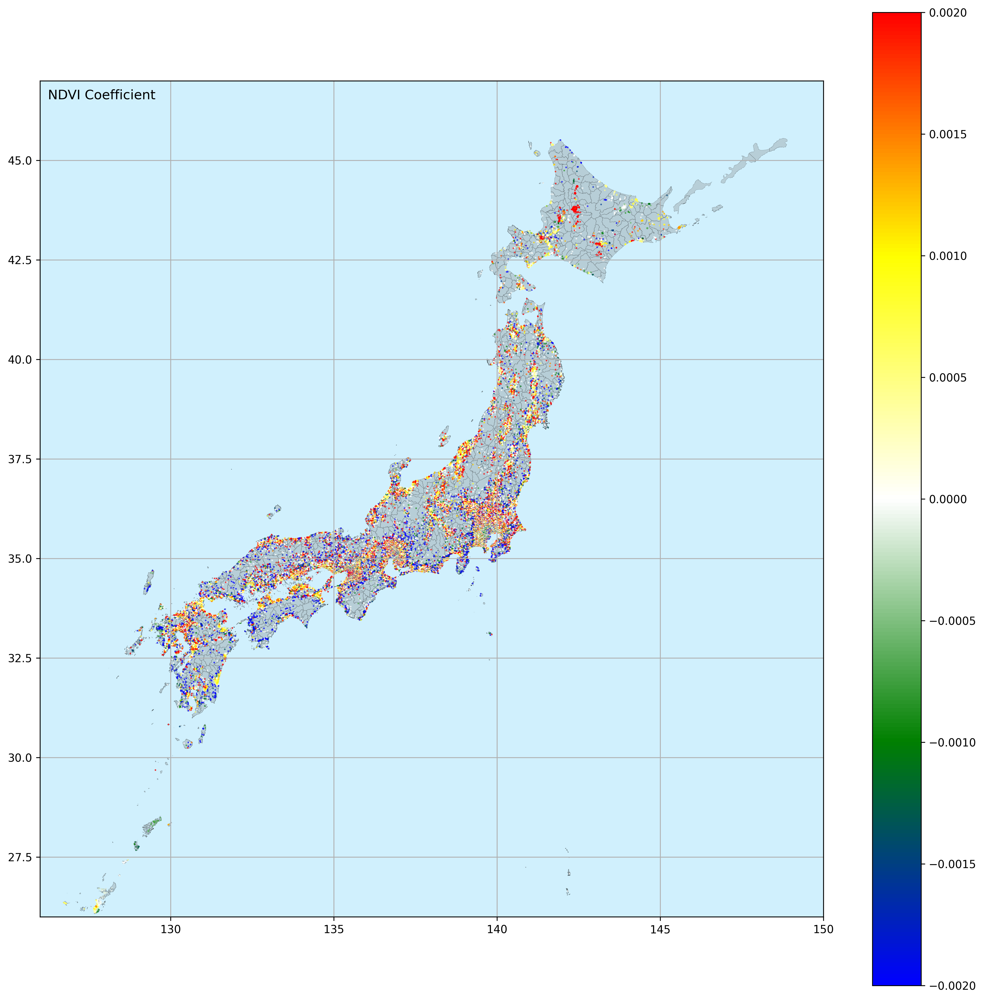

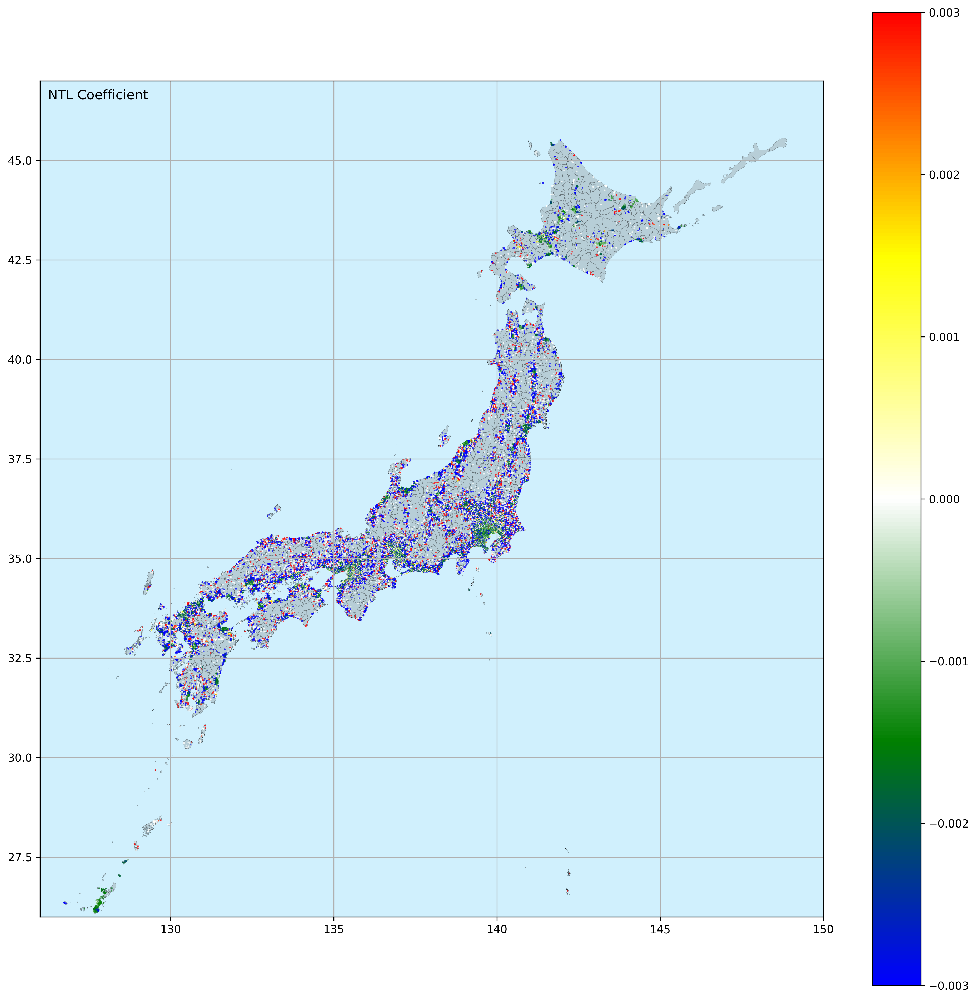

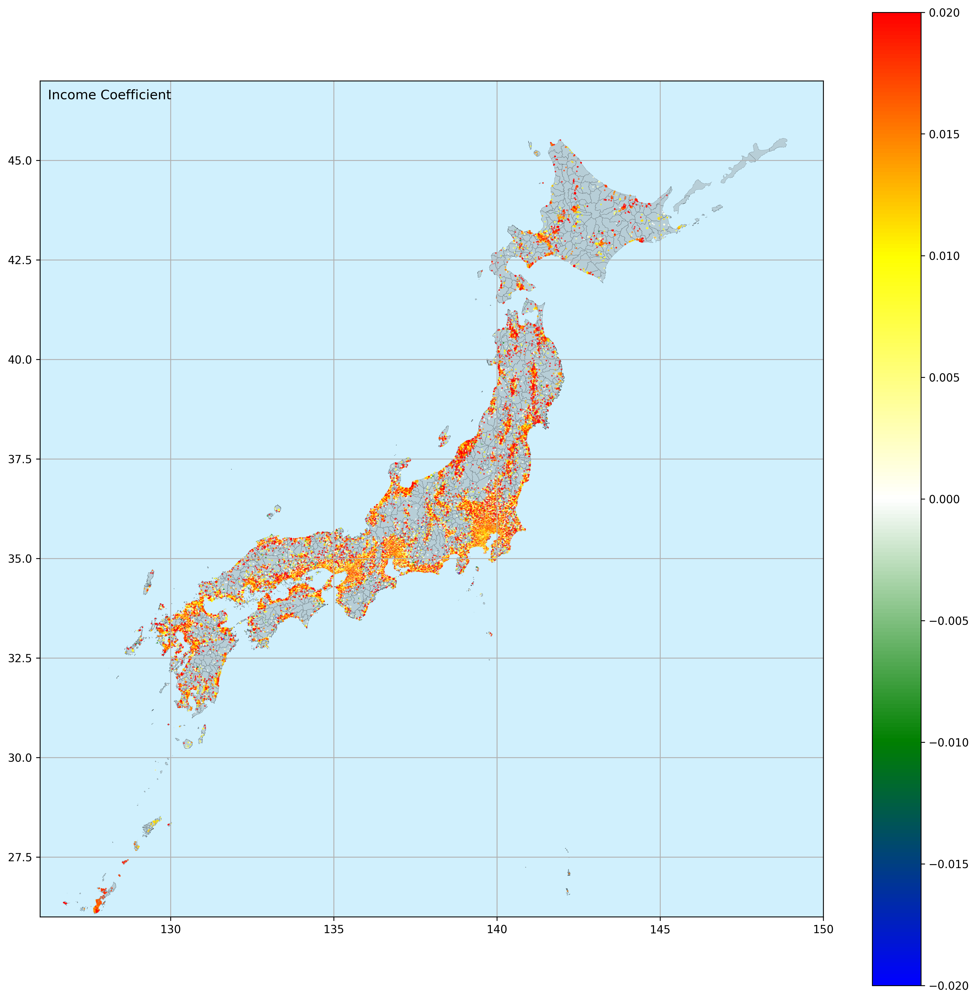

In [327]:
# Define the population change columns and titles
columns = ["coeff_ndvi", "coeff_ntl", "coeff_income"]
titles = [
    "NDVI Coefficient", "NTL Coefficient",
    "Income Coefficient"
]

# Iterate through the variables and plot each separately
for aim_variable, title, vmin, vmax in zip(columns, titles, vmins, vmaxs):
    # Create a new figure
    fig, ax = plt.subplots(figsize=(16, 16), dpi=300)

    # Set the ocean color
    ax.set_facecolor(ocean_color)

    # Plot city boundaries
    city_gdf.plot(ax=ax, edgecolor='black', alpha=0.3, linewidth=0.2, facecolor='gray')

    # Plot the data
    collection = result_gdf_loc.plot(
        column=aim_variable, 
        ax=ax, 
        cmap=cmap, 
        vmin=vmin, 
        vmax=vmax, 
        alpha=0.8, 
        markersize=0.2, 
        legend=True
    )

    # Add annotation
    ax.annotate(
        title, 
        xy=(0.01, 0.99), 
        xycoords='axes fraction', 
        fontsize=12, 
        ha='left', 
        va='top', 
        color='black'
    )

    # Set grid and limits for the main plot
    ax.grid(True)
    ax.set_xlim(126, 150)
    ax.set_ylim(26, 47)

    # Save or show the plot
    # Uncomment to save
    fig.savefig(f'04_Figure/Fig_Coeff_{aim_variable}.jpg', format='jpg', dpi=300, bbox_inches='tight')

    # Show the plot
    plt.show()

## Visual Map MWTP

### GDF Coefficient

In [328]:
result_df_ndvi = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_NDVI.xlsx', index_col = 0)

In [329]:
result_df_ndvi.loc[result_df_ndvi['r2'] < 0.5, 'coeff'] = 0

In [330]:
result_df_ndvi_loc = result_df_ndvi.drop_duplicates()

In [331]:
result_df_ndvi_loc = result_df_ndvi_loc[['lat', 'lon', 'coeff']]

In [332]:
result_df_ndvi_loc.columns = ['lat', 'lon', 'coeff_ndvi']

In [333]:
result_df_ntl = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_NTL.xlsx', index_col = 0)

In [334]:
result_df_ntl.loc[result_df_ntl['r2'] < 0.5, 'coeff'] = 0

In [335]:
result_df_ntl_loc = result_df_ntl.drop_duplicates()

In [336]:
result_df_ntl_loc = result_df_ntl_loc[['lat', 'lon', 'coeff']]

In [337]:
result_df_ntl_loc.columns = ['lat', 'lon', 'coeff_ntl']

In [338]:
result_df_income = pd.read_excel('03_Results/PdpConnectionCoef/PdpConnection_income_indiv.xlsx', index_col = 0)

In [339]:
result_df_income.loc[result_df_income['r2'] < 0.5, 'coeff'] = 0

In [340]:
result_df_income_loc = result_df_income.drop_duplicates()

In [341]:
result_df_income_loc = result_df_income_loc[['lat', 'lon', 'coeff']]

In [342]:
result_df_income_loc.columns = ['lat', 'lon', 'coeff_income']

In [343]:
merged_df = pd.merge(result_df_ndvi_loc, result_df_ntl_loc, on=['lat', 'lon'], how='left')
result_df_loc_merge = pd.merge(merged_df, result_df_income_loc, on=['lat', 'lon'], how='left')

In [344]:
result_df_loc_merge['MWPT_NDVI'] = result_df_loc_merge['coeff_ndvi'] / result_df_loc_merge['coeff_income'] / 120.96 * 1_000_000

In [345]:
result_df_loc_merge['MWPT_NTL'] = result_df_loc_merge['coeff_ntl'] / result_df_loc_merge['coeff_income'] / 120.96 * 1_000_000

In [346]:
result_df_loc_merge = result_df_loc_merge.groupby(['lat', 'lon']).mean()

In [347]:
result_df_loc_merge = result_df_loc_merge.reset_index()

In [348]:
result_df_loc_merge = result_df_loc_merge.replace([np.inf, -np.inf], 0)
result_df_loc_merge = result_df_loc_merge.fillna(0)

In [349]:
result_df_loc_merge

,lat,lon,coeff_ndvi,coeff_ntl,coeff_income,MWPT_NDVI,MWPT_NTL
0,24.301767,123.869034,0.000623,0.002606,0.012935,397.937368,1665.706083
1,24.332844,124.162926,0.000623,0.002606,0.012935,397.937368,1665.706083
2,24.333654,123.762947,0.000623,0.002606,0.012935,397.937368,1665.706083
3,24.337803,124.143456,0.000623,0.002606,0.012935,397.937368,1665.706083
4,24.338045,124.155281,0.000623,0.002606,0.012935,397.937368,1665.706083
...,...,...,...,...,...,...,...
50847,45.414669,141.675354,0.000427,-0.001518,0.015371,229.445169,-816.388649
50848,45.424519,141.672470,0.000385,-0.001209,0.015325,207.478637,-652.232316
50849,45.437248,141.661224,0.000000,-0.002073,0.015574,0.000000,-1100.318091
50850,45.445702,141.647858,0.001931,-0.001548,0.026338,606.117435,-485.862537


In [350]:
def create_geometry(row):
    return Point(row['lon'], row['lat'])

In [351]:
result_df_loc_merge['geometry'] = result_df_loc_merge.apply(create_geometry, axis=1)

In [352]:
crs = "EPSG:4326"
result_gdf_loc = gpd.GeoDataFrame(result_df_loc_merge, geometry='geometry', crs=crs)

In [353]:
result_gdf_loc.describe()

,lat,lon,coeff_ndvi,coeff_ntl,coeff_income,MWPT_NDVI,MWPT_NTL
count,50852.000000,50852.000000,50852.000000,50852.000000,50852.000000,5.085200e+04,5.085200e+04
mean,35.773296,136.851359,0.000364,-0.002037,0.014759,3.790114e+02,-1.434595e+03
std,2.480900,3.331468,0.002655,0.006116,0.011206,7.491180e+04,8.196221e+04
min,24.301767,123.762947,-0.072164,-0.125678,-0.060621,-8.448932e+06,-1.175134e+07
25%,34.667910,135.207962,0.000000,-0.002577,0.008527,0.000000e+00,-1.520402e+03
50%,35.226959,136.923462,0.000000,-0.001347,0.013553,0.000000e+00,-7.223015e+02
75%,36.277805,139.635010,0.001134,0.000000,0.018700,6.111250e+02,0.000000e+00
max,45.511021,145.742340,0.054274,0.093483,0.162315,1.183274e+07,4.179183e+06


### Visualize

In [354]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["blue","green", "white", "yellow", "red"])

In [355]:
vmins = [-1000, -2000]
vmaxs = [1000, 2000]

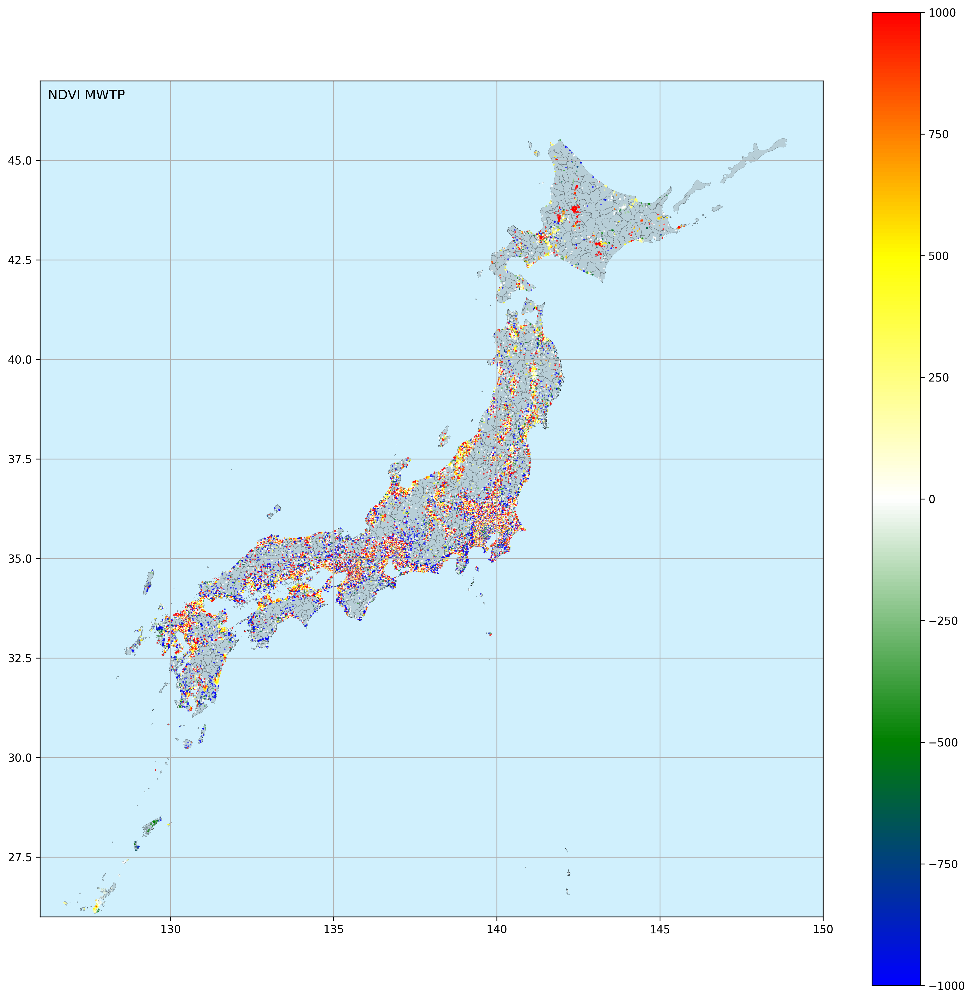

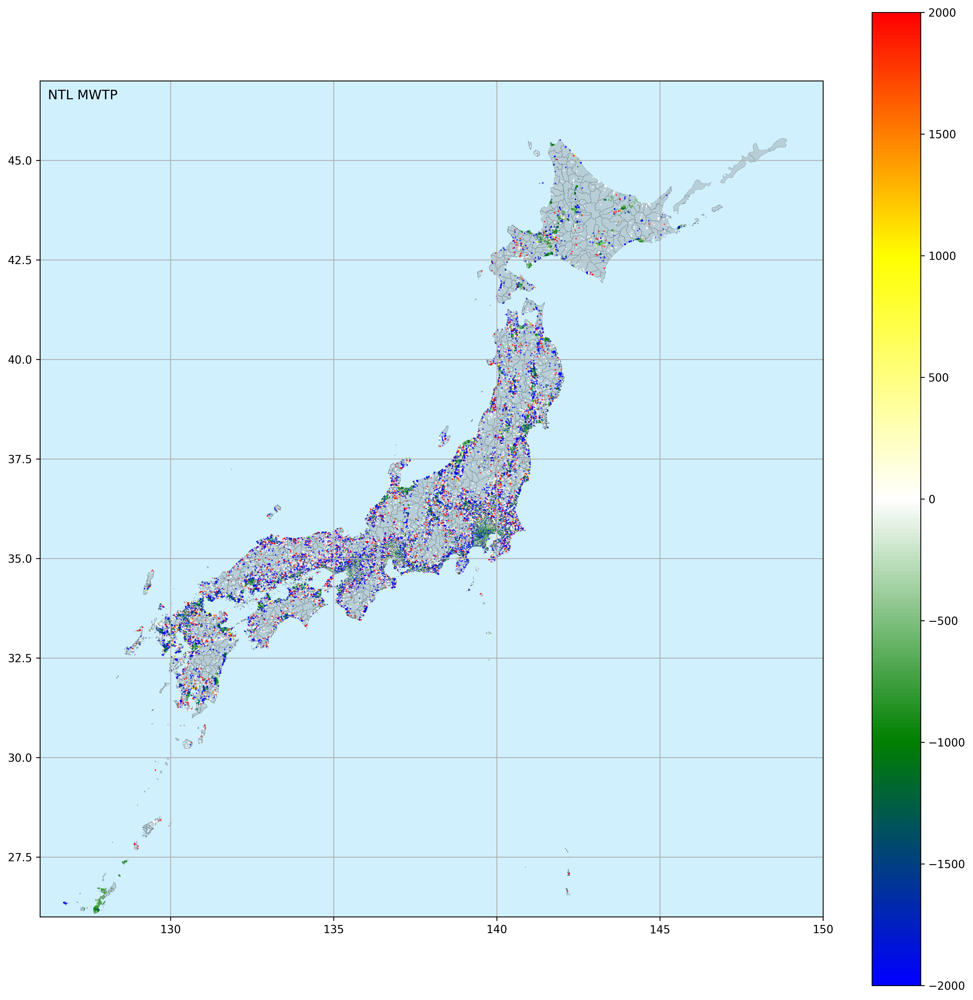

In [356]:
# Define the population change columns and titles
columns = ["MWPT_NDVI", "MWPT_NTL"]
titles = [
    "NDVI MWTP", "NTL MWTP"
]

# Iterate through the variables and plot each separately
for aim_variable, title, vmin, vmax in zip(columns, titles, vmins, vmaxs):
    # Create a new figure
    fig, ax = plt.subplots(figsize=(16, 16), dpi=300)

    # Set the ocean color
    ax.set_facecolor(ocean_color)

    # Plot city boundaries
    city_gdf.plot(ax=ax, edgecolor='black', alpha=0.3, linewidth=0.2, facecolor='gray')

    # Plot the data
    collection = result_gdf_loc.plot(
        column=aim_variable, 
        ax=ax, 
        cmap=cmap, 
        vmin=vmin, 
        vmax=vmax, 
        alpha=0.8, 
        markersize=0.2, 
        legend=True
    )

    # Add annotation
    ax.annotate(
        title, 
        xy=(0.01, 0.99), 
        xycoords='axes fraction', 
        fontsize=12, 
        ha='left', 
        va='top', 
        color='black'
    )

    # Set grid and limits for the main plot
    ax.grid(True)
    ax.set_xlim(126, 150)
    ax.set_ylim(26, 47)

    # Save or show the plot
    # Uncomment to save
    fig.savefig(f'04_Figure/Fig_MWTP_{aim_variable}.jpg', format='jpg', dpi=300, bbox_inches='tight')

    # Show the plot
    plt.show()

In [357]:
result_gdf_loc.describe()

,lat,lon,coeff_ndvi,coeff_ntl,coeff_income,MWPT_NDVI,MWPT_NTL
count,50852.000000,50852.000000,50852.000000,50852.000000,50852.000000,5.085200e+04,5.085200e+04
mean,35.773296,136.851359,0.000364,-0.002037,0.014759,3.790114e+02,-1.434595e+03
std,2.480900,3.331468,0.002655,0.006116,0.011206,7.491180e+04,8.196221e+04
min,24.301767,123.762947,-0.072164,-0.125678,-0.060621,-8.448932e+06,-1.175134e+07
25%,34.667910,135.207962,0.000000,-0.002577,0.008527,0.000000e+00,-1.520402e+03
50%,35.226959,136.923462,0.000000,-0.001347,0.013553,0.000000e+00,-7.223015e+02
75%,36.277805,139.635010,0.001134,0.000000,0.018700,6.111250e+02,0.000000e+00
max,45.511021,145.742340,0.054274,0.093483,0.162315,1.183274e+07,4.179183e+06


In [359]:
result_gdf_loc.columns

Index(['lat', 'lon', 'coeff_ndvi', 'coeff_ntl', 'coeff_income', 'MWPT_NDVI',
       'MWPT_NTL', 'geometry'],
      dtype='object')

In [363]:
mean_value = result_gdf_loc[['coeff_ndvi', 'coeff_ntl', 'coeff_income', 'MWPT_NDVI',
       'MWPT_NTL']].mean()

In [361]:
std_values = result_gdf_loc[['coeff_ndvi', 'coeff_ntl', 'coeff_income', 'MWPT_NDVI', 'MWPT_NTL']].std()
n_values = result_gdf_loc[['coeff_ndvi', 'coeff_ntl', 'coeff_income', 'MWPT_NDVI', 'MWPT_NTL']].count()
se_values = std_values / np.sqrt(n_values)

In [362]:
se_values

coeff_ndvi        0.000012
coeff_ntl         0.000027
coeff_income      0.000050
MWPT_NDVI       332.197382
MWPT_NTL        363.462534
dtype: float64

In [364]:
mean_value - 1.96 * se_values

coeff_ndvi         0.000341
coeff_ntl         -0.002090
coeff_income       0.014661
MWPT_NDVI       -272.095517
MWPT_NTL       -2146.981223
dtype: float64

In [365]:
mean_value + 1.96 * se_values

coeff_ndvi         0.000387
coeff_ntl         -0.001984
coeff_income       0.014856
MWPT_NDVI       1030.118223
MWPT_NTL        -722.208092
dtype: float64

In [369]:
coeff_ci = pd.concat([mean_value, mean_value - 1.96 * se_values, mean_value + 1.96 * se_values], axis = 1)

In [371]:
coeff_ci.columns = ['Mean', '95% CI Lower Boundary', '95% CI Upper Boundary']

In [372]:
coeff_ci.index = ['Local Marginal Effect Coefficient of NDVI', 'Local Marginal Effect Coefficient NTL', 'Local Marginal Effect  Coefficient Income',
                 'MWTP of NDVI', 'MWTP of NTL']

In [373]:
coeff_ci

,Mean,95% CI Lower Boundary,95% CI Upper Boundary
Local Marginal Effect Coefficient of NDVI,0.000364,0.000341,0.000387
Local Marginal Effect Coefficient NTL,-0.002037,-0.002090,-0.001984
Local Marginal Effect Coefficient Income,0.014759,0.014661,0.014856
MWTP of NDVI,379.011353,-272.095517,1030.118223
MWTP of NTL,-1434.594657,-2146.981223,-722.208092


In [375]:
coeff_ci.to_excel('03_Results/Summary_MWTP.xlsx')